<a href="https://colab.research.google.com/github/thasliya0404/projetict/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_csv('/content/cleaned_data.csv')

In [ ]:
data = data[data]

ValueError: Boolean array expected for the condition, not int64

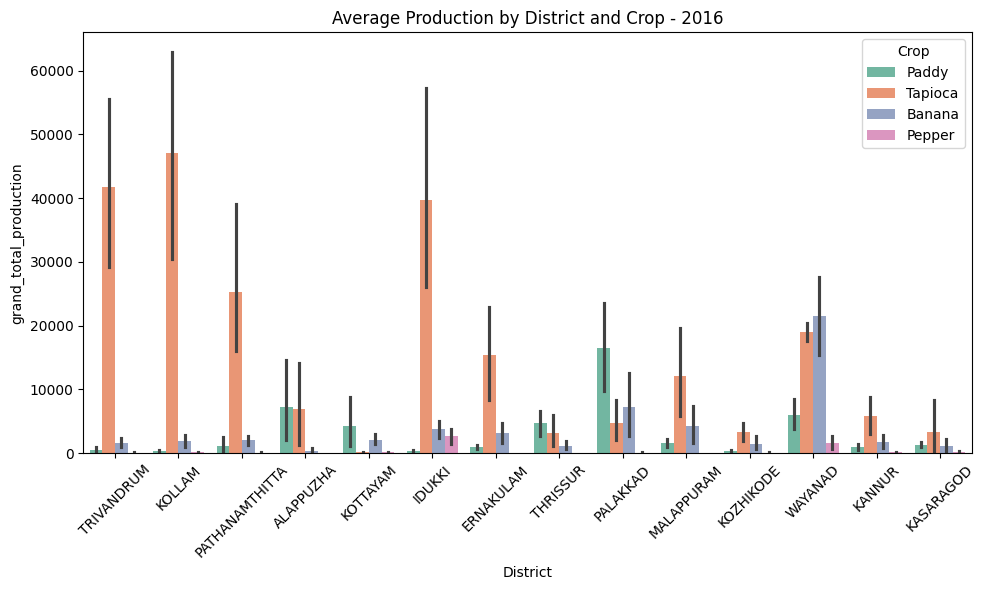

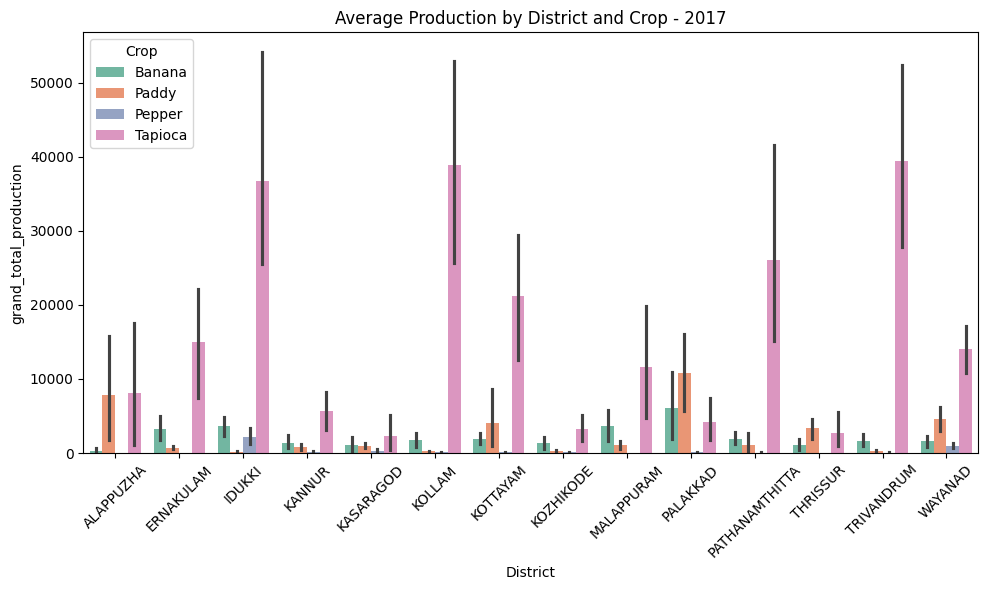

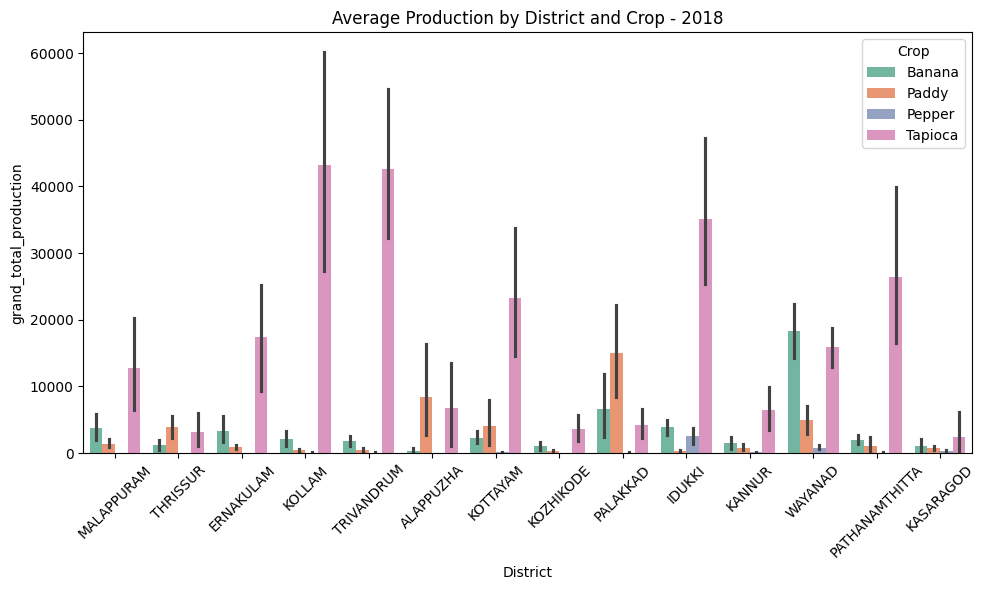

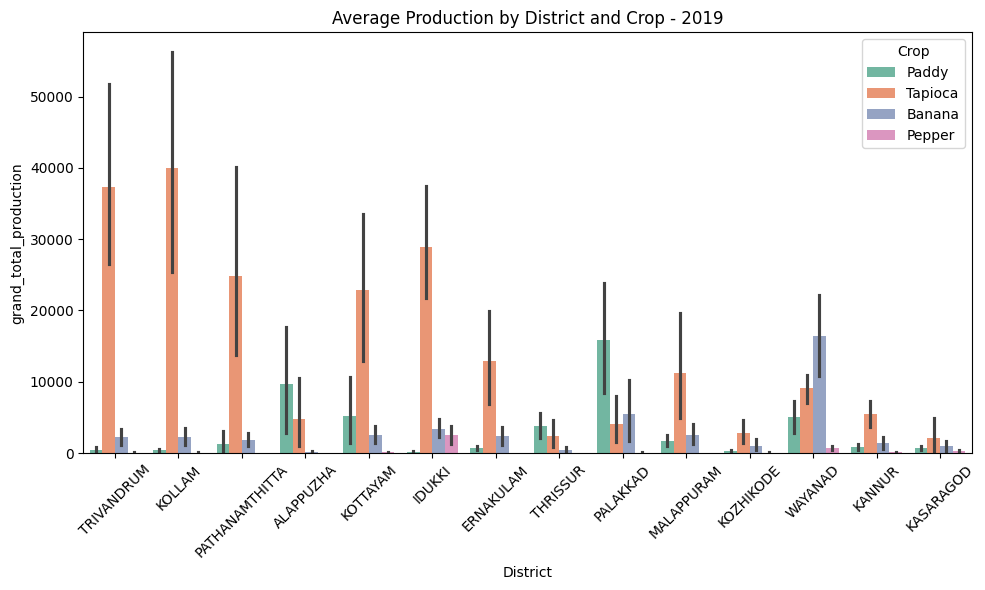

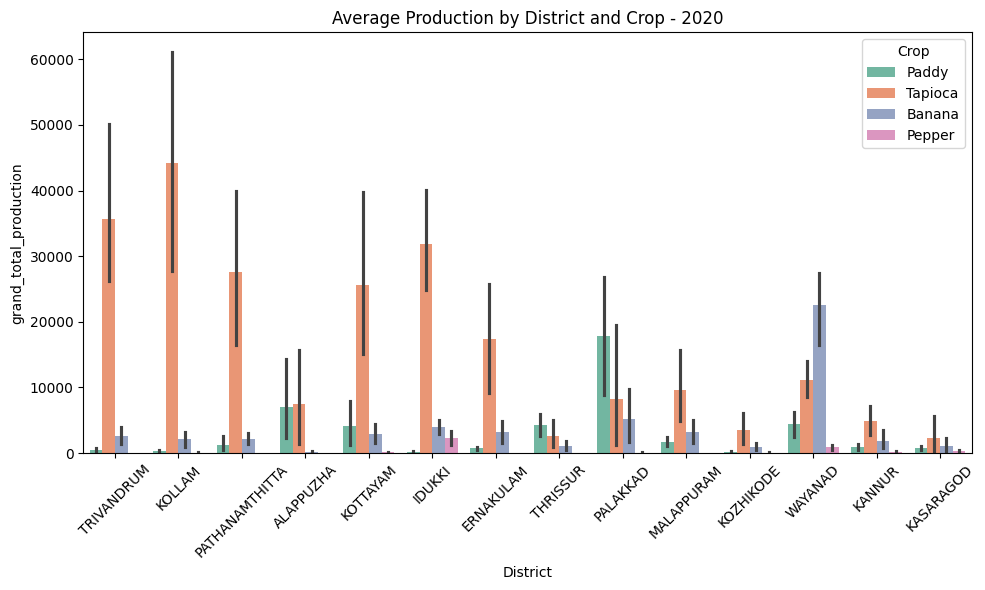

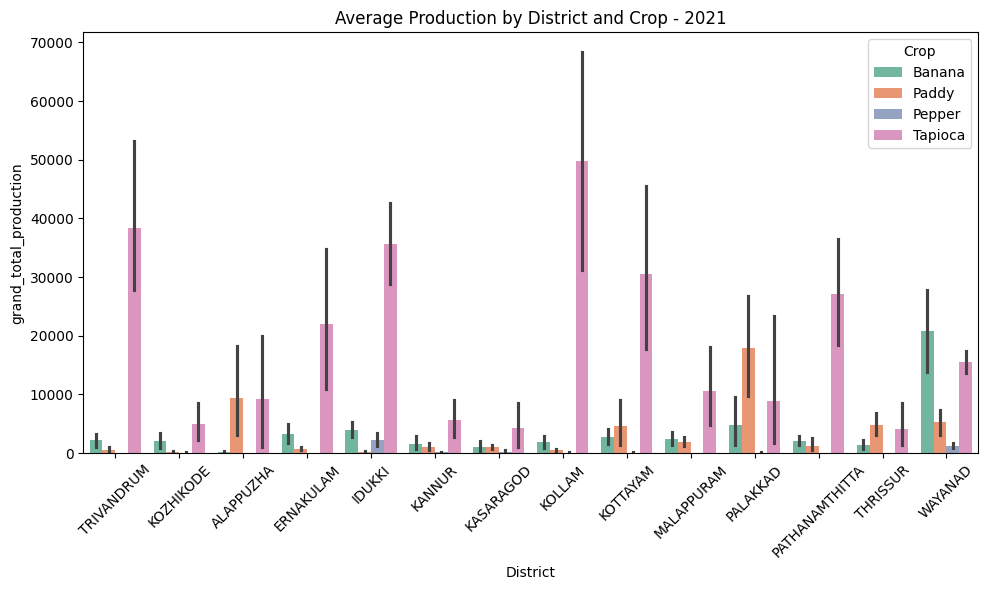

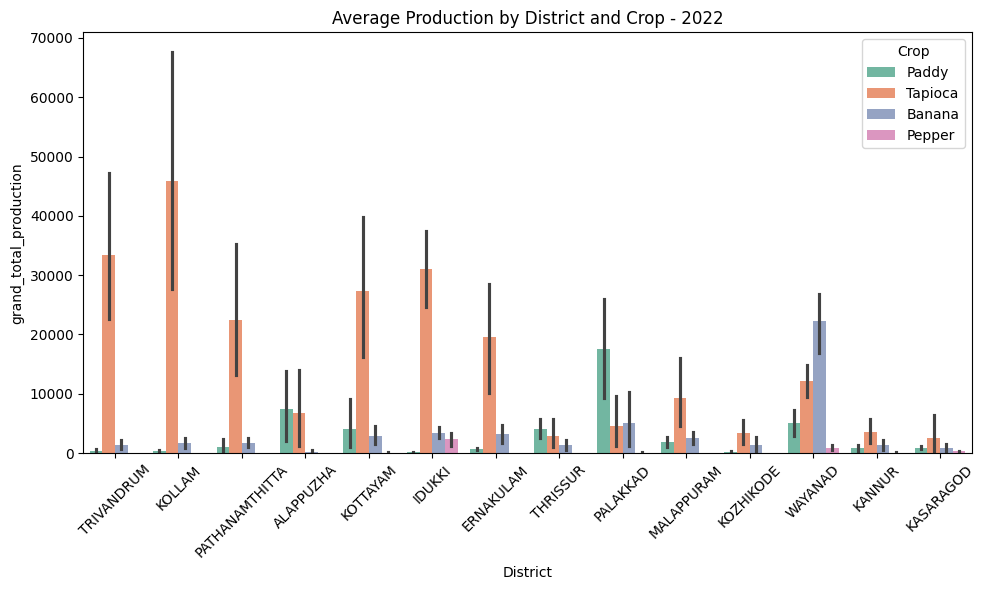

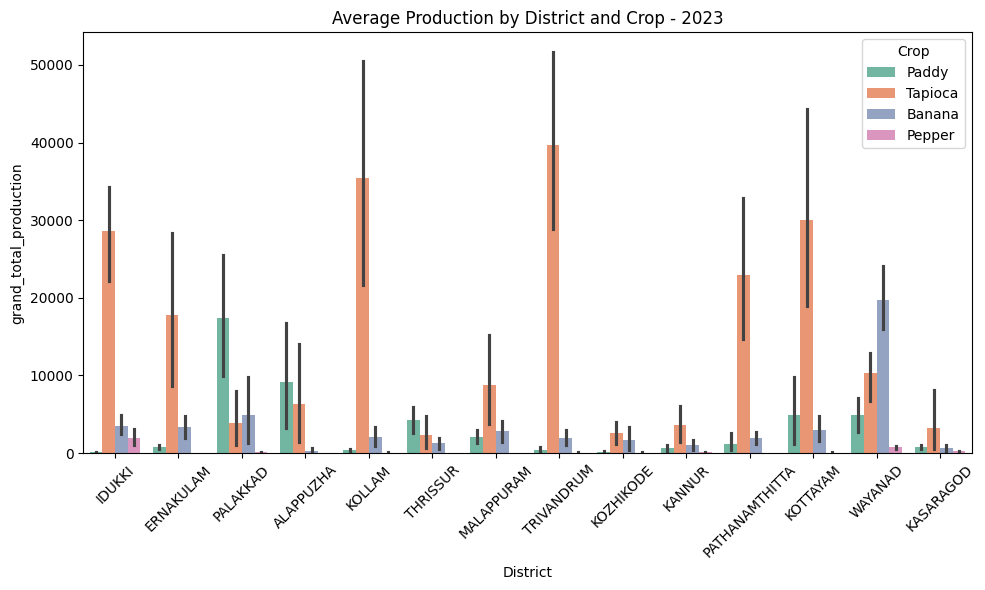

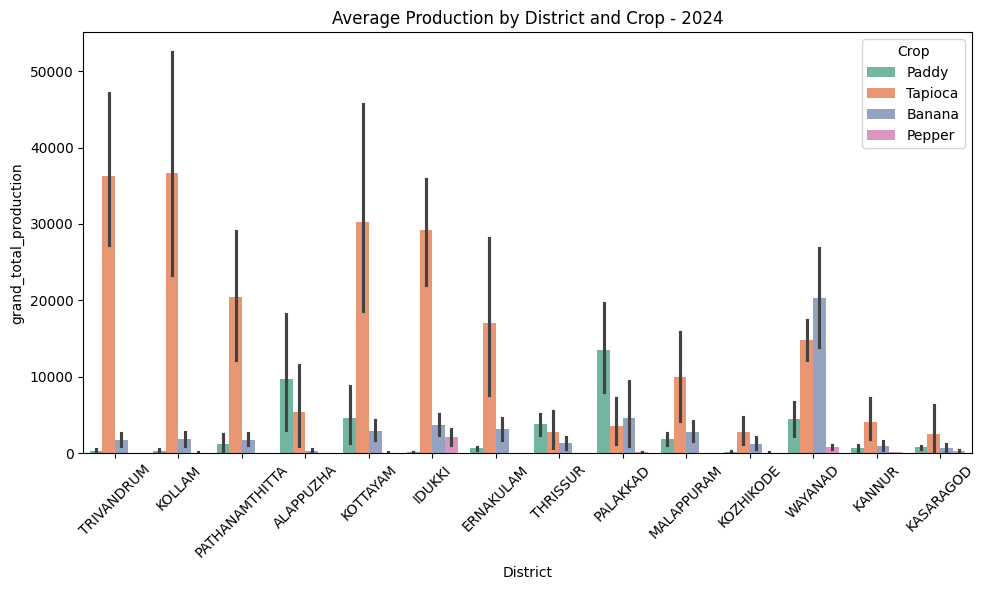

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

years = sorted(data['Year'].unique())  # list of all years

for year in years:
    plt.figure(figsize=(10,6))

    # filter the data for that year
    df_year = data[data['Year'] == year]

    # bar plot: average production by district & crop
    sns.barplot(
        data=df_year,
        x='District',
        y='grand_total_production',
        hue='Crop',
        estimator='mean',
        palette='Set2'
    )

    plt.title(f'Average Production by District and Crop - {year}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


* **Kollam **stands at the top of production in Kerala for the majority of the years from 2016–2024.

* **Wayanad** has been the highest producer of banana in most of those years.

* **Idukki** is the highest producer of pepper, followed by Wayanad.

* **Palakkad** is the largest producer of paddy.



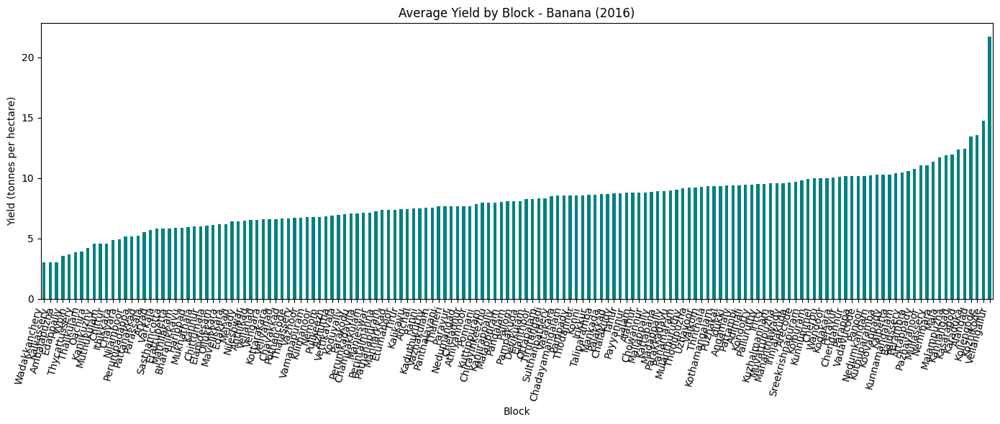

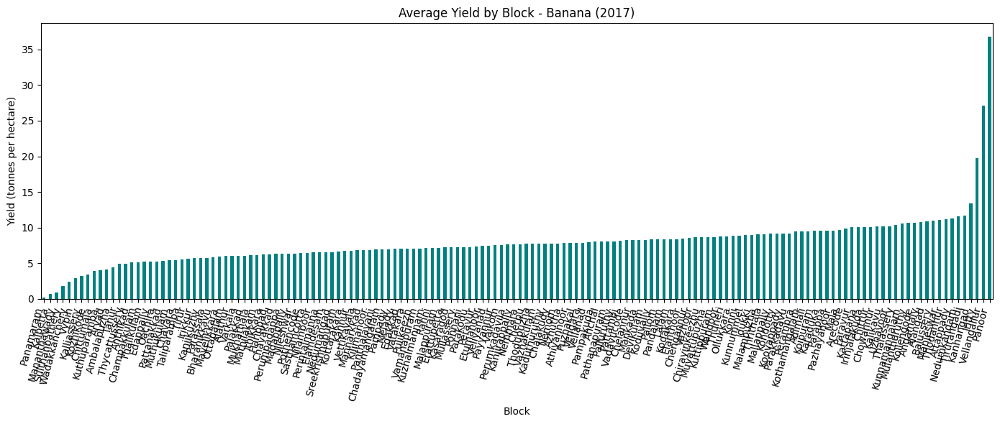

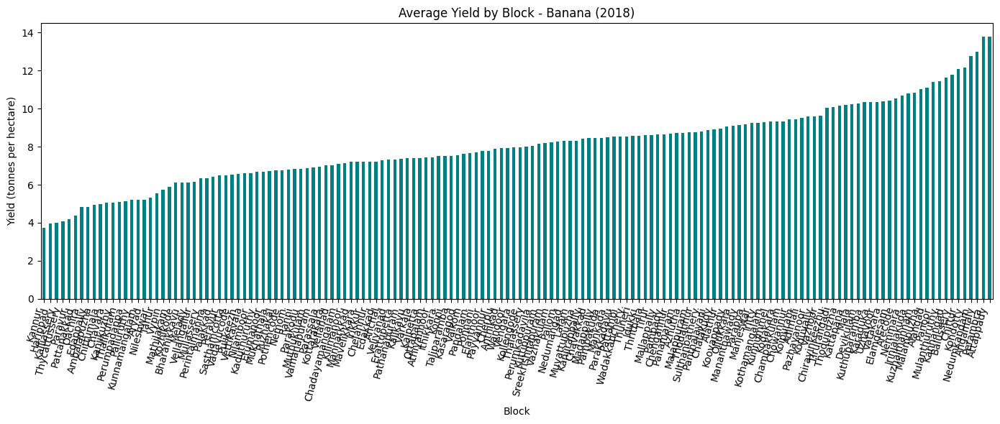

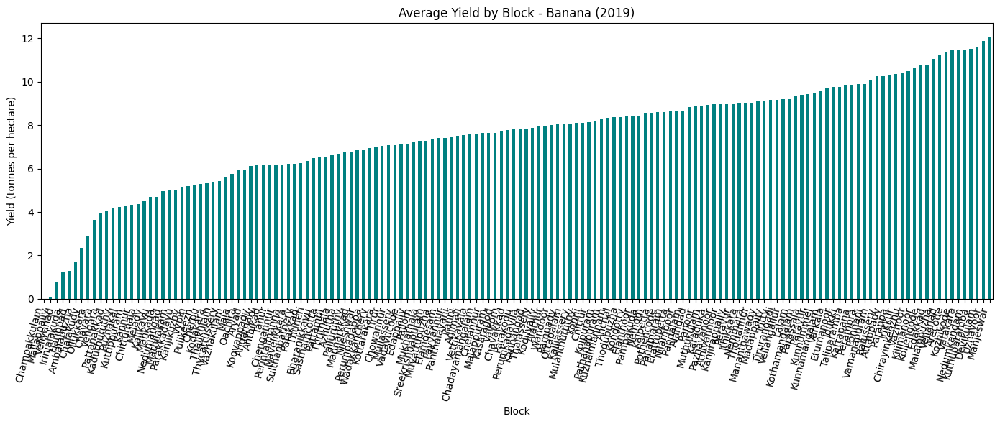

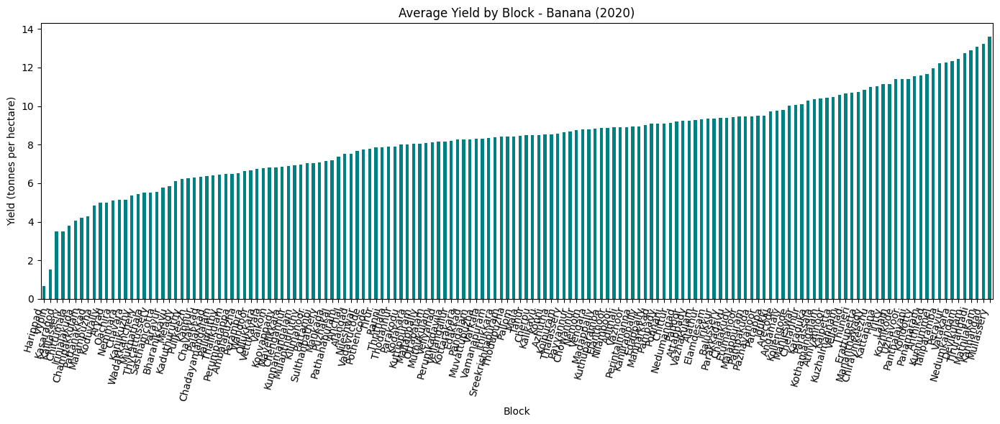

...

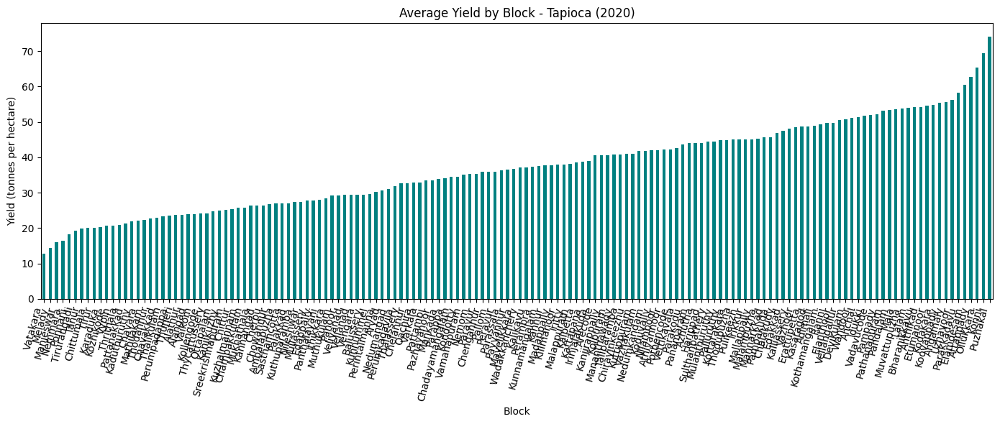

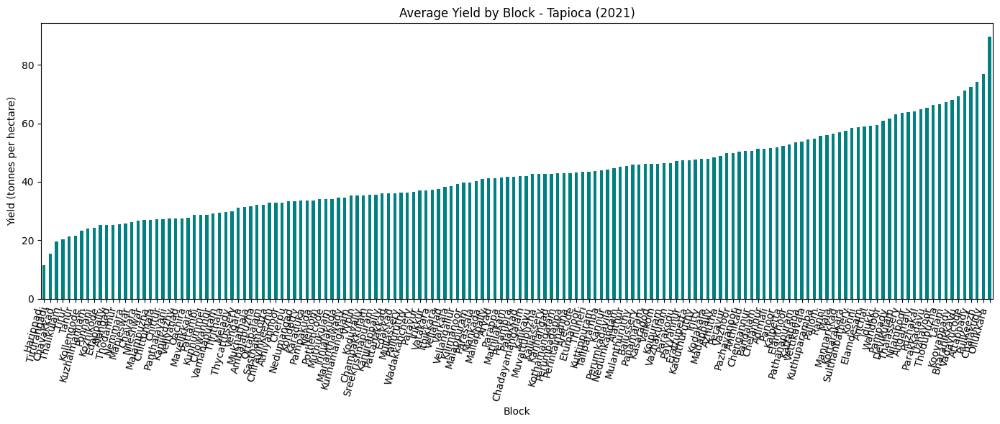

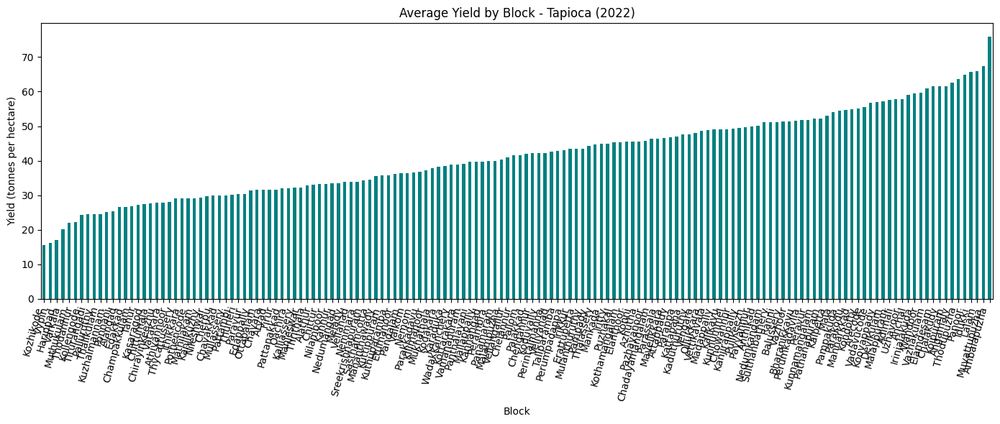

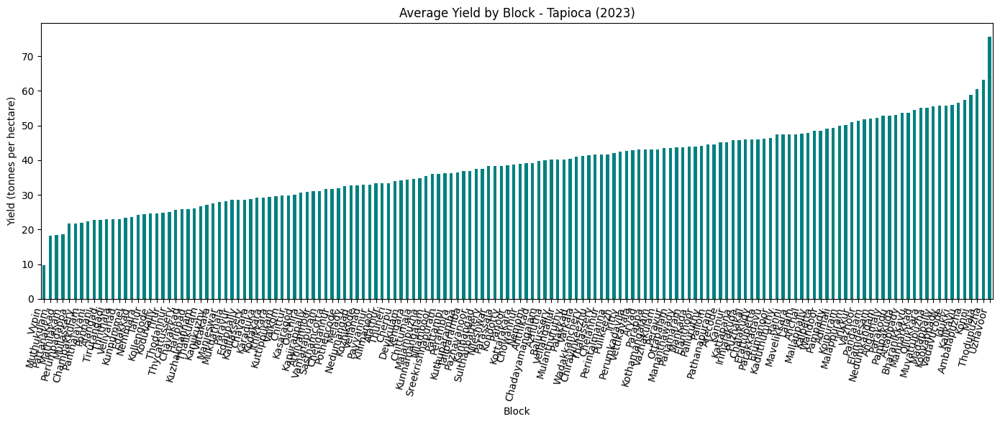

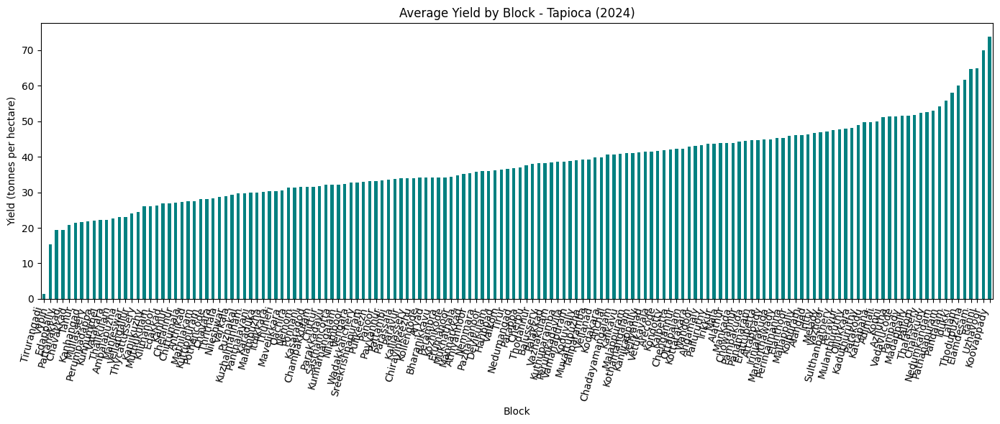

In [ ]:
import matplotlib.pyplot as plt

# Get all unique crops and years
crops = sorted(data['Crop'].unique())
years = sorted(data['Year'].unique())

# Loop over each crop and year
for crop in crops:
    for year in years:
        # Filter for this crop & year
        df_sub = data[(data['Crop'] == crop) & (data['Year'] == year)]

        # Skip if no data
        if df_sub.empty:
            continue

        # Calculate mean yield per block
        mean_yield = df_sub.groupby('Block_name')['Yield'].mean().sort_values()

        # Plot
        plt.figure(figsize=(14, 6))
        mean_yield.plot(kind='bar', color='teal')

        plt.title(f"Average Yield by Block - {crop} ({year})")
        plt.ylabel("Yield (tonnes per hectare)")
        plt.xlabel("Block")
        plt.xticks(rotation=75, ha='right')
        plt.tight_layout()
        plt.show()


* Banana: Maximum yield reaches up to 16 tonnes/ha


* Paddy: Maximum yield reaches up to 6 tonnes/ha


* Pepper: Maximum yield reaches up to 1 tonne/ha


* Tapioca: Maximum yield reaches up to 80 tonnes/ha



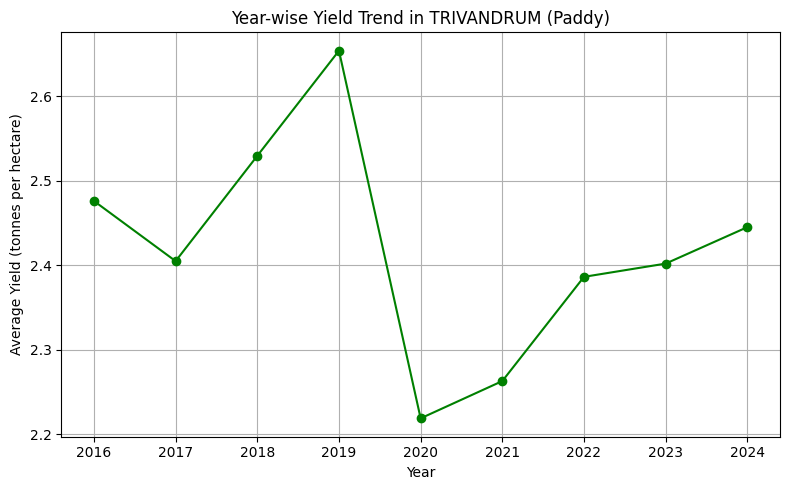

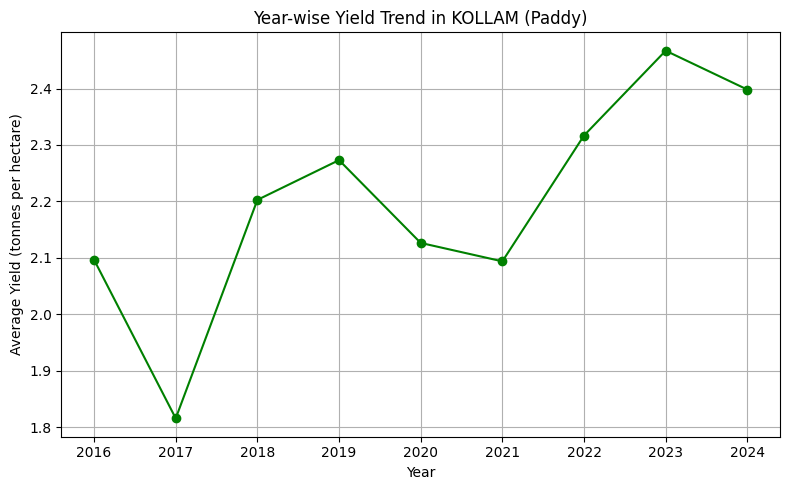

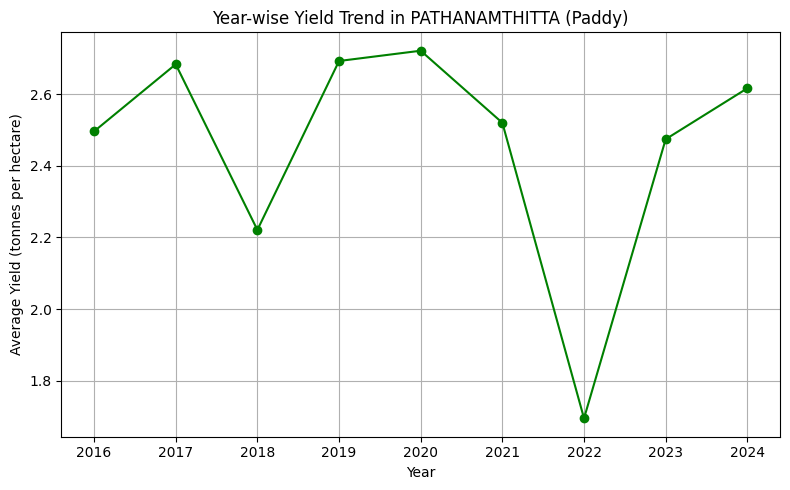

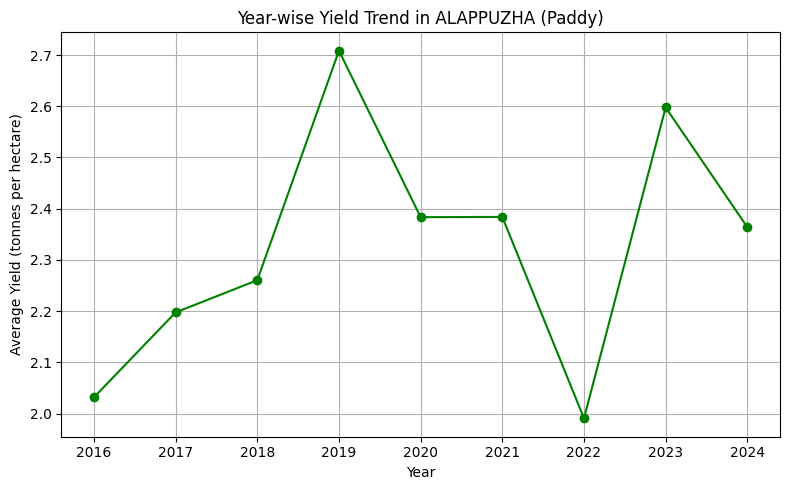

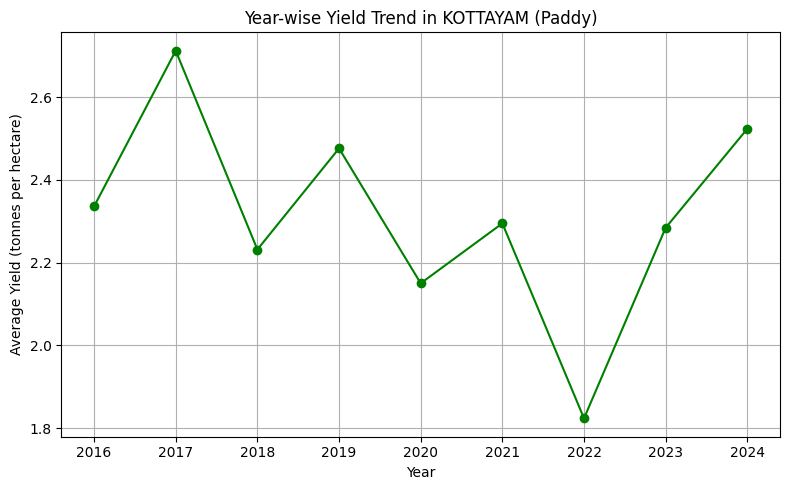

...

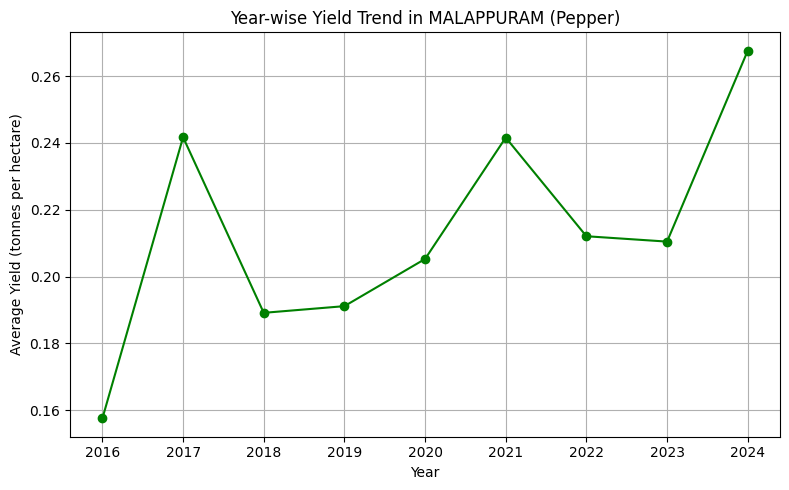

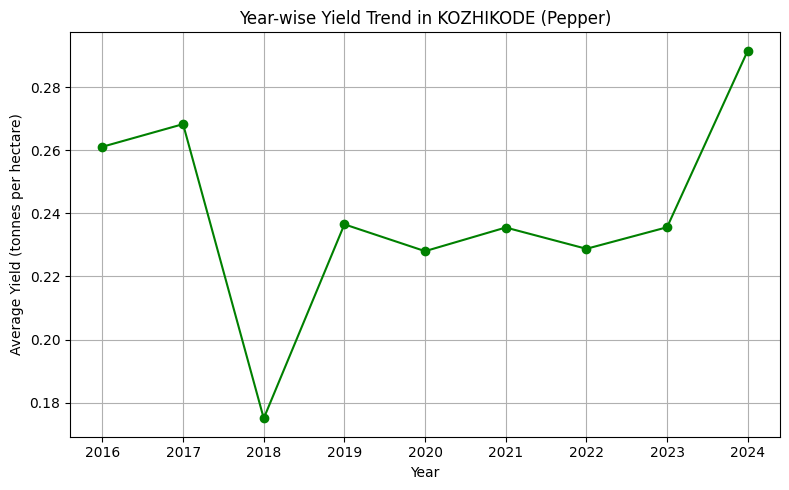

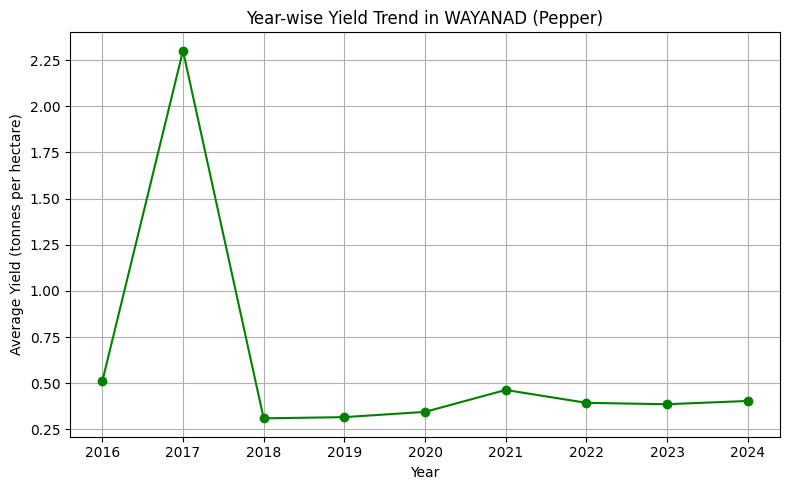

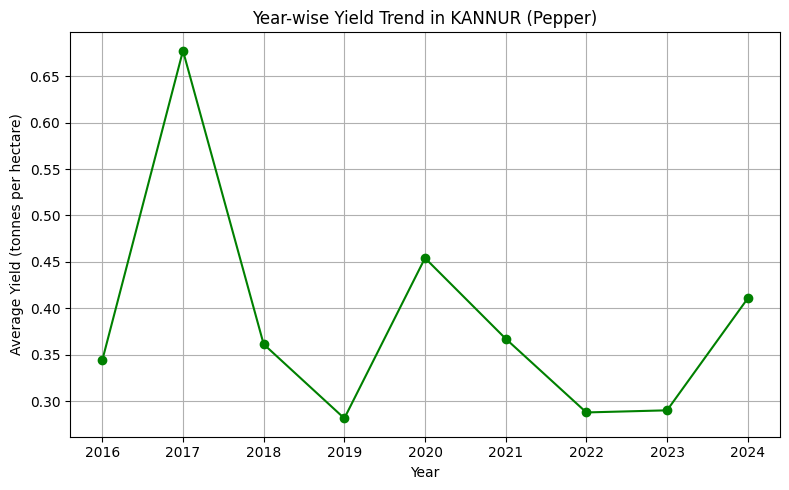

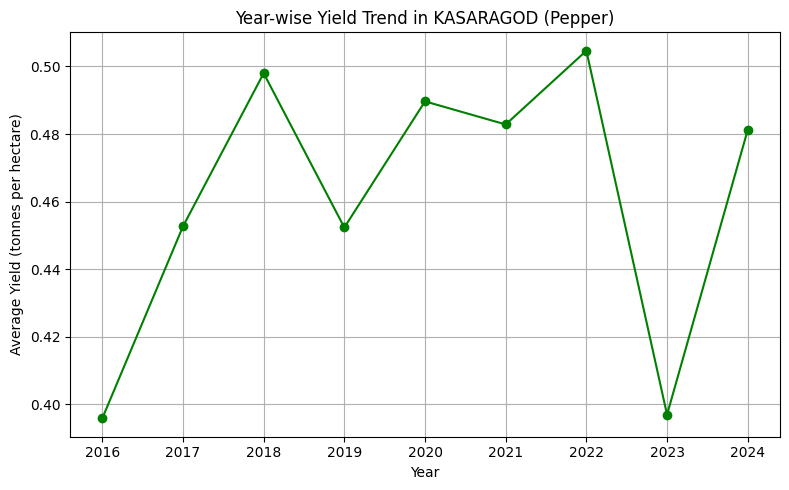

In [ ]:
import matplotlib.pyplot as plt

# Loop through each crop
for crop in data['Crop'].unique():
    crop_data = data[data['Crop'] == crop]

    # Get the list of unique districts for that crop
    districts = crop_data['District'].unique()

    # Loop through each district
    for district in districts:
        district_data = crop_data[crop_data['District'] == district]

        # Group by Year → calculate mean yield
        yearly_yield = (
            district_data.groupby('Year')['Yield']
            .mean()
            .reset_index()
            .sort_values('Year')
        )

        # Skip if not enough data points
        if len(yearly_yield) < 2:
            continue

        # Plot
        plt.figure(figsize=(8, 5))
        plt.plot(
            yearly_yield['Year'],
            yearly_yield['Yield'],
            marker='o',
            color='green'
        )
        plt.title(f"Year-wise Yield Trend in {district} ({crop})")
        plt.xlabel("Year")
        plt.ylabel("Average Yield (tonnes per hectare)")
        plt.grid(True)
        plt.tight_layout()
        plt.show()



*  2021–2022: Significant surge in tapioca yield across Kerala.

*  2019: Tapioca production was low in eight districts.

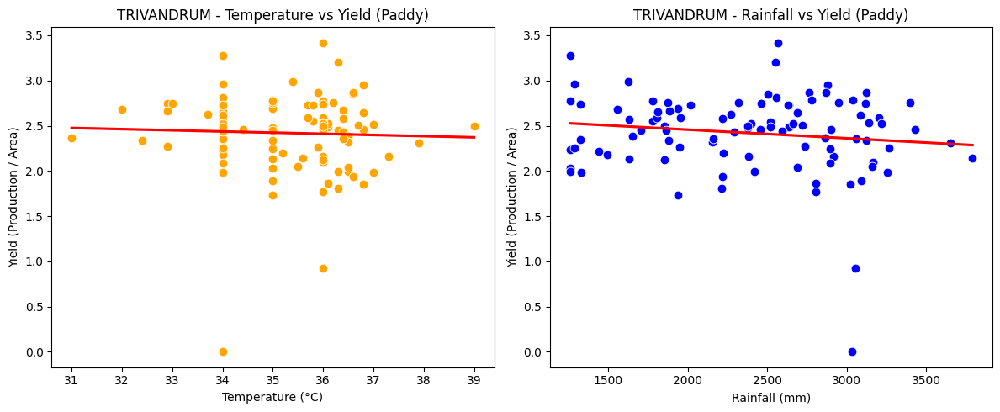

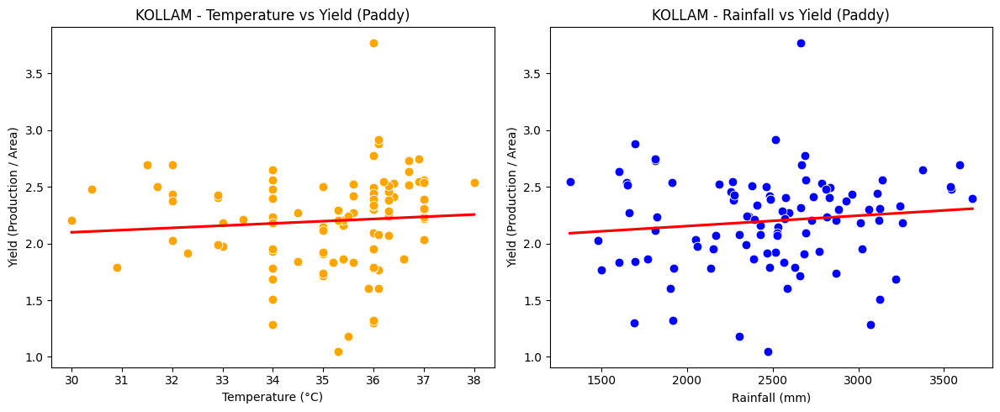

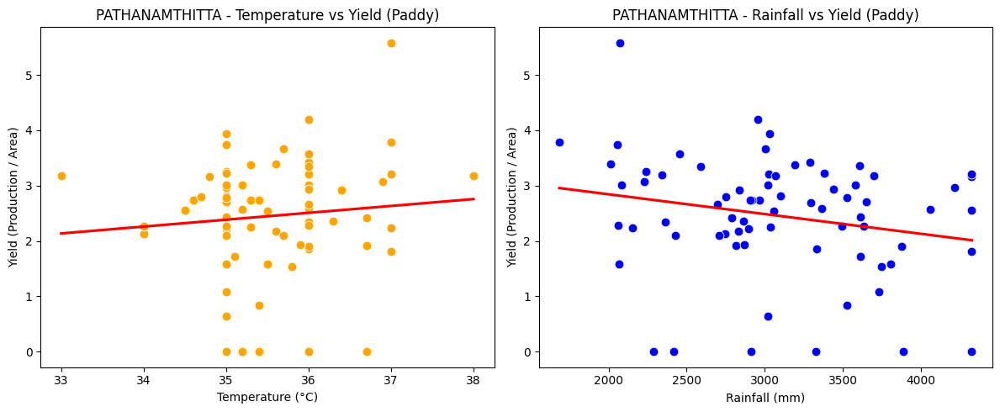

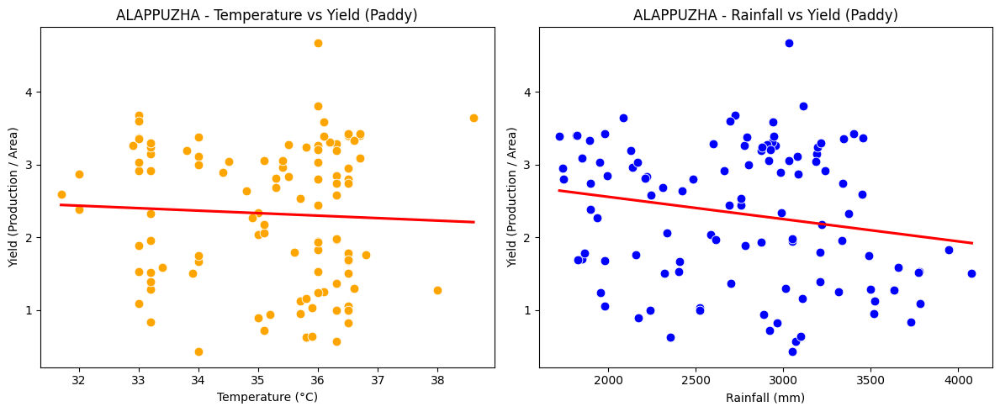

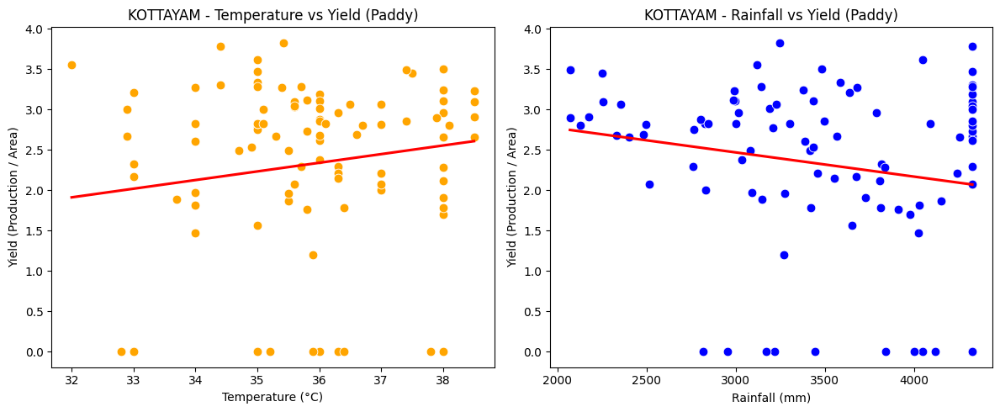

...

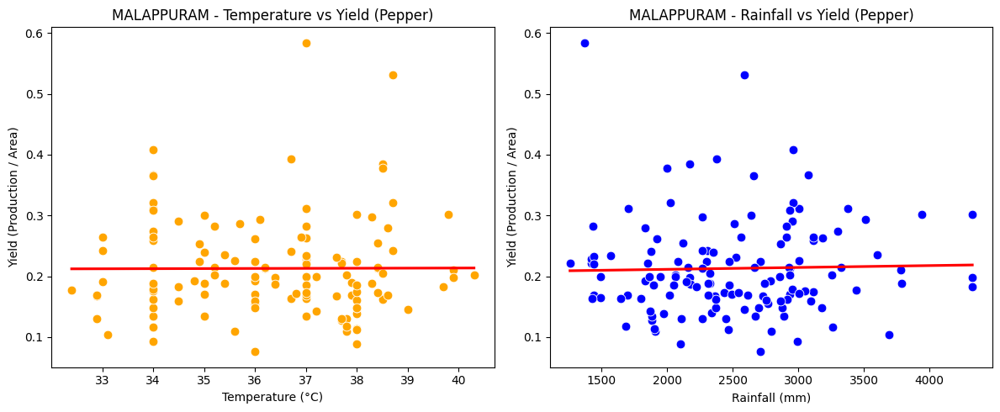

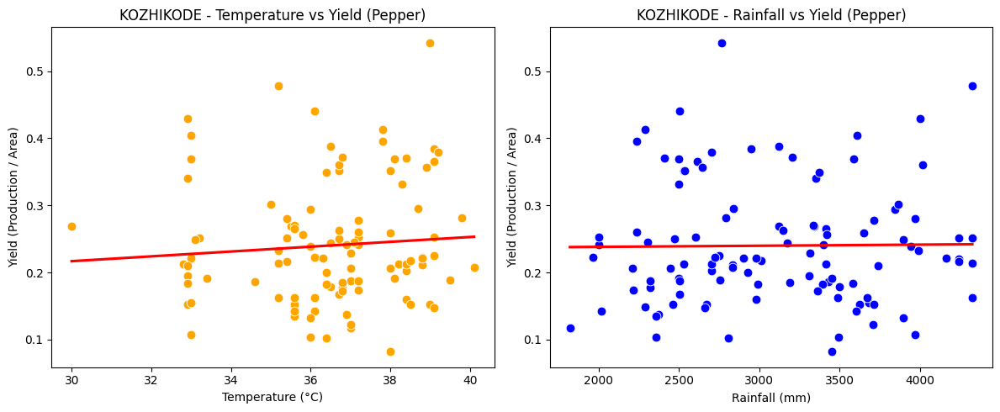

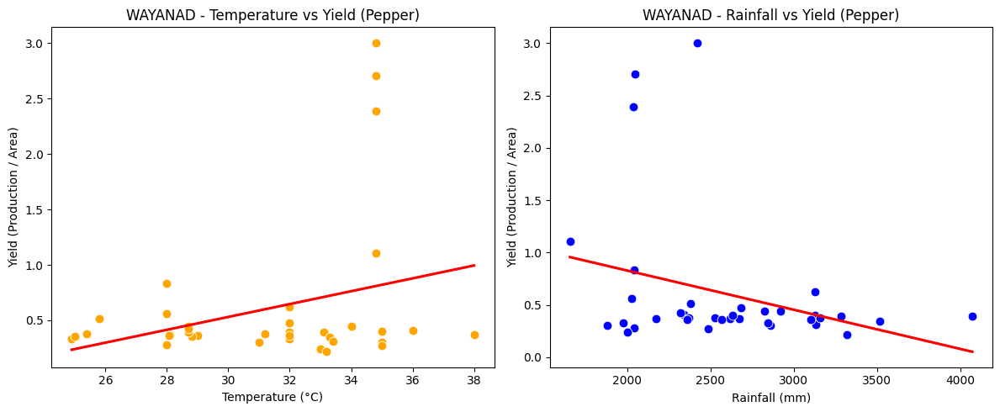

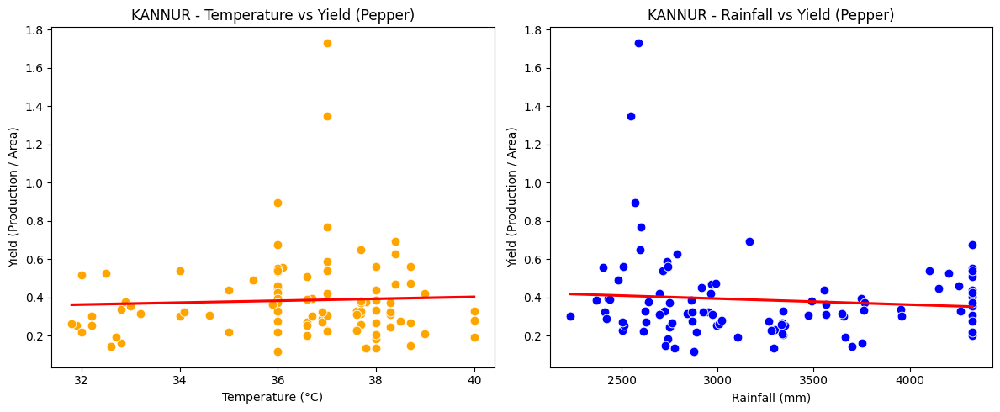

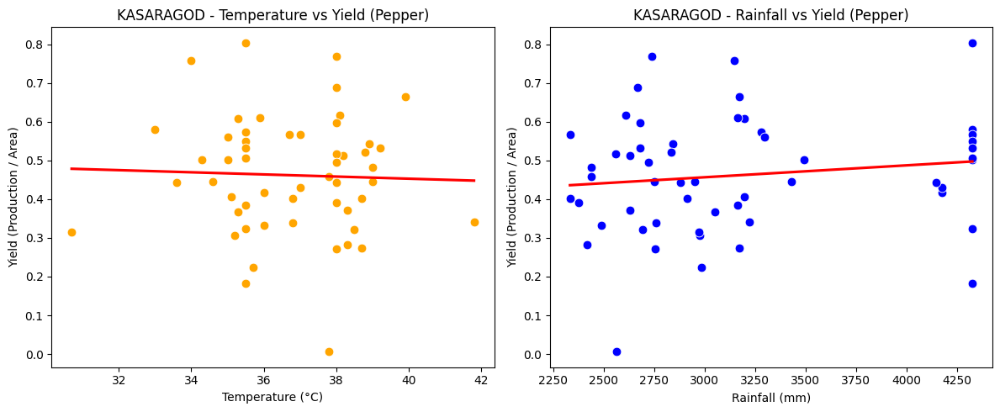

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get list of unique crops and districts
crops = data['Crop'].unique()
districts = data['District'].unique()

# Loop through each crop
for crop in crops:
    crop_data = data[data['Crop'] == crop]

    # Loop through each district for that crop
    for district in districts:
        subset = crop_data[crop_data['District'] == district]

        # Skip if there’s no data for this crop-district combo
        if subset.empty:
            continue

        # Create figure with 2 subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        # 1️⃣ Temperature vs Yield
        sns.scatterplot(data=subset, x='Temp_max(C)', y='Yield', ax=axes[0], color='orange', s=60)
        sns.regplot(data=subset, x='Temp_max(C)', y='Yield', ax=axes[0], scatter=False, color='red', ci=None)
        axes[0].set_title(f'{district} - Temperature vs Yield ({crop})')
        axes[0].set_xlabel('Temperature (°C)')
        axes[0].set_ylabel('Yield (Production / Area)')

        # 2️⃣ Rainfall vs Yield
        sns.scatterplot(data=subset, x='Rain_fall_actual(mm)', y='Yield', ax=axes[1], color='blue', s=60)
        sns.regplot(data=subset, x='Rain_fall_actual(mm)', y='Yield', ax=axes[1], scatter=False, color='red', ci=None)
        axes[1].set_title(f'{district} - Rainfall vs Yield ({crop})')
        axes[1].set_xlabel('Rainfall (mm)')
        axes[1].set_ylabel('Yield (Production / Area)')

        plt.tight_layout()
        plt.show()

In [ ]:
"""for Tapioca when temperature increases then the yield decreases in majority of the district, rainfall has inverse relationship
for papper in district like idukki and wayanad when temperature inc yield inc, rinfall has inverse relationship
papper need high temperature in most district"""

'for Tapioca when temperature increases then the yield decreases in majority of the district, rainfall has inverse relationship\nfor papper in district like idukki and wayanad when temperature inc yield inc, rinfall has inverse relationship\npapper need high temperature in most district'



*   Tapioca: In most districts, yield decreases as temperature increases, and rainfall shows an inverse relationship with yield.
*   Pepper: In districts like Idukki and Wayanad, yield increases with rising temperature, while rainfall has an inverse relationship; pepper generally requires higher temperatures in most districts.


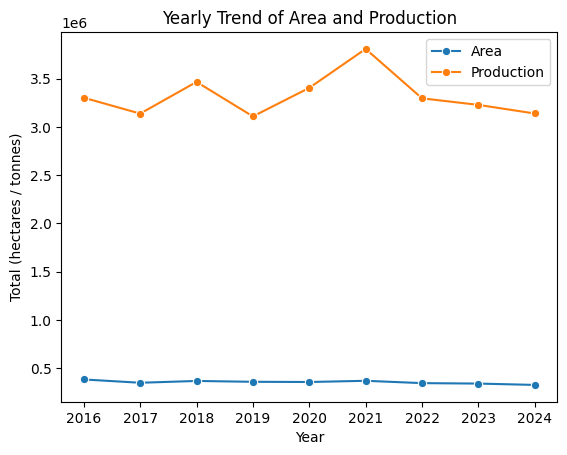

In [ ]:
yearly = data.groupby("Year")[["grand_total_area", "grand_total_production"]].sum().reset_index()

sns.lineplot(data=yearly, x="Year", y="grand_total_area", marker="o", label="Area")
sns.lineplot(data=yearly, x="Year", y="grand_total_production", marker="o", label="Production")
plt.title("Yearly Trend of Area and Production")
plt.ylabel("Total (hectares / tonnes)")
plt.legend()
plt.show()   # due to covid 19 government focused on improving the
#production thus led to increase in production

Production was highest in the year 2021

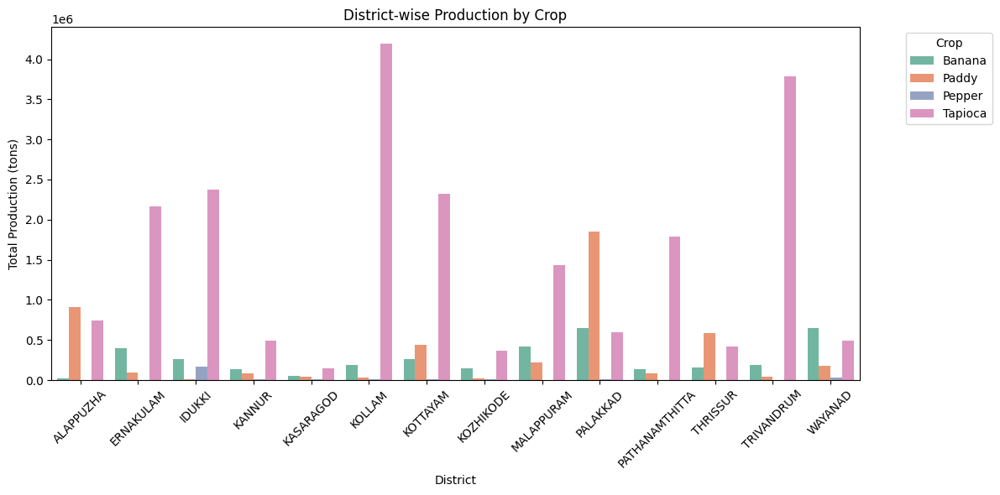

In [ ]:
prod_summary = data.groupby(['District', 'Crop'])['grand_total_production'].sum().reset_index()
plt.figure(figsize=(12,6))
sns.barplot(
    data=prod_summary,
    x='District',
    y='grand_total_production',
    hue='Crop',
    palette='Set2'
)

plt.title('District-wise Production by Crop')
plt.xlabel('District')
plt.ylabel('Total Production (tons)')
plt.legend(title='Crop', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



*   Tapioca and paddy: Highest production in 2021
*   Banana: Highest production in 2016
*  Pepper: Production remained stable






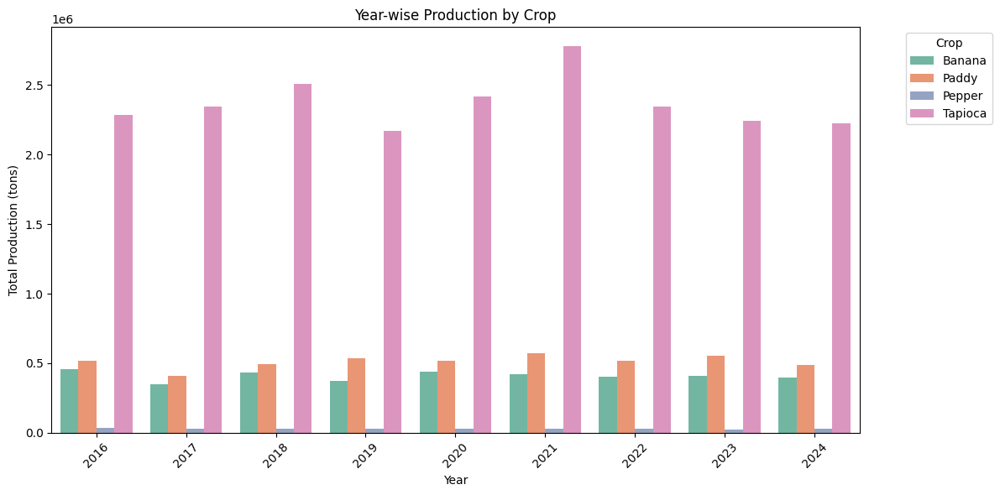

In [ ]:
prod_summary1 = data.groupby(['Year', 'Crop'])[['grand_total_production']].sum().reset_index()
plt.figure(figsize=(12,6))
sns.barplot(
    data=prod_summary1,
    x='Year',
    y='grand_total_production',
    hue='Crop',
    palette='Set2'
)

plt.title('Year-wise Production by Crop')
plt.xlabel('Year')
plt.ylabel('Total Production (tons)')
plt.legend(title='Crop', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

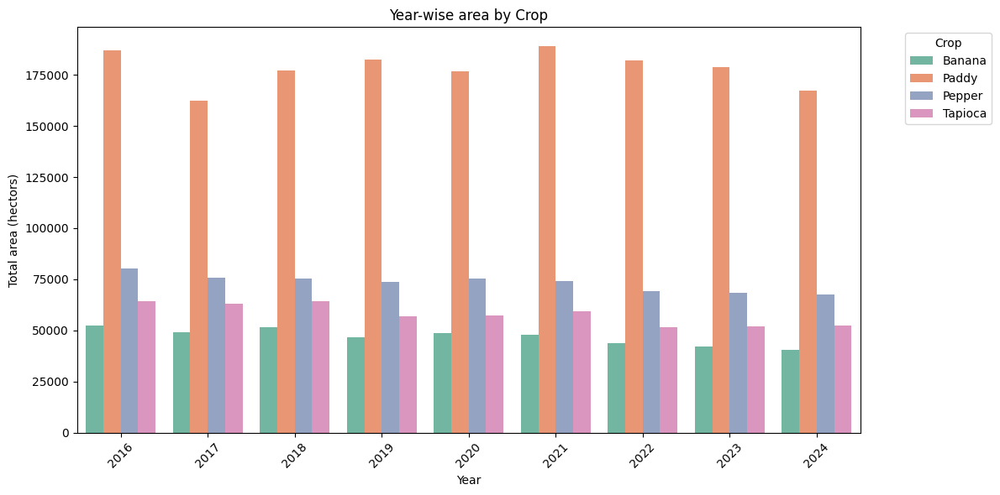

In [ ]:
prod_summary2 = data.groupby(['Year', 'Crop'])[['grand_total_area']].sum().reset_index()
plt.figure(figsize=(12,6))
sns.barplot(
    data=prod_summary2,
    x='Year',
    y='grand_total_area',
    hue='Crop',
    palette='Set2'
)

plt.title('Year-wise area by Crop')
plt.xlabel('Year')
plt.ylabel('Total area (hectors)')
plt.legend(title='Crop', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

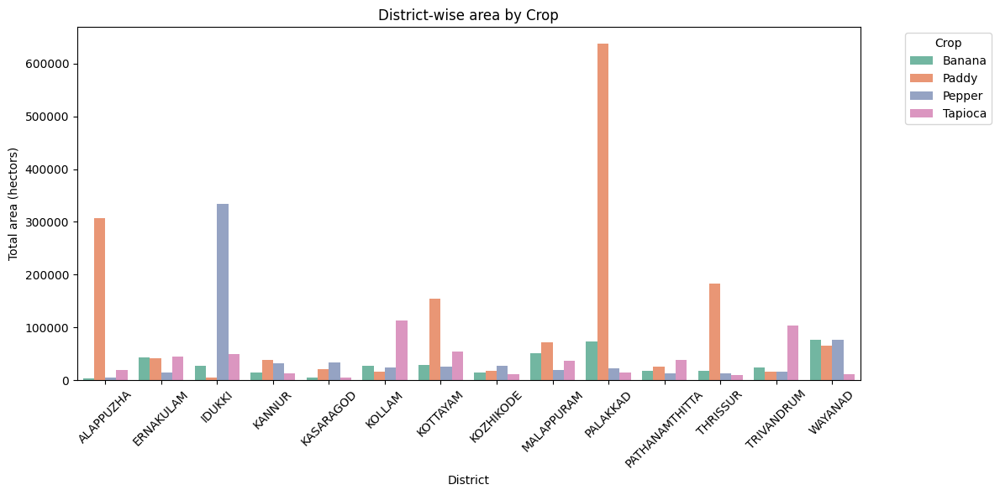

In [ ]:
prod_summary3 = data.groupby(['District', 'Crop'])[['grand_total_area']].sum().reset_index()
plt.figure(figsize=(12,6))
sns.barplot(
    data=prod_summary3,
    x='District',
    y='grand_total_area',
    hue='Crop',
    palette='Set2'
)

plt.title('District-wise area by Crop')
plt.xlabel('District')
plt.ylabel('Total area (hectors)')
plt.legend(title='Crop', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



*   Paddy: Area highest in Palakkad
*   Pepper: Area highest in Idukki

